In [11]:
import os
import matplotlib.pyplot as plt
import librosa, librosa.display
import IPython.display as ipd
import numpy as np

In [74]:
# # BASE_FOLDER = "/home/valerio/PycharmProjects/AudioSignalProcessingForML/14- Extracting the Discrete Fourier Transform/audio/"
violin_sound_file = "./audio/violin_c.wav"
piano_c4="./audio/Kawai-K11-GrPiano-C4.wav"


In [54]:
  ipd.Audio( violin_sound_file) 

In [55]:
 ipd.Audio( piano_c4)

In [56]:
# load sounds
violin_c4, sr = librosa.load( violin_sound_file)
pian_c4, sr = librosa.load( piano_c4)
 

In [57]:
p=librosa.get_samplerate(piano_c4)
p

44100

In [58]:
len(pian_c4)

151296

In [59]:
X = np.fft.fft(pian_c4)
X.shape
len(X)

151296

In [60]:
y = np.fft.fft(pian_c4)
len(y)

151296

In [61]:
# ################3 piano   reconstructed version

Text(0.5, 1.0, 'Piano_C_major_waveform')

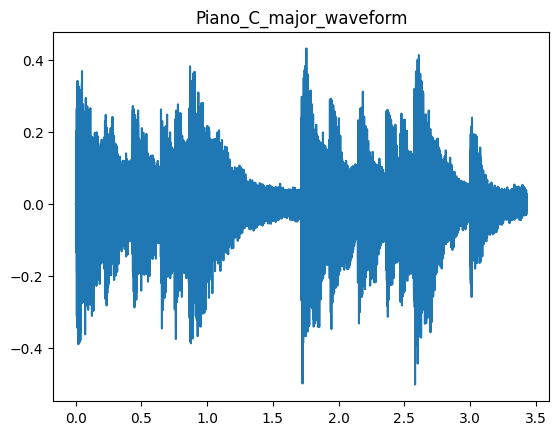

In [66]:
N = 151296 # number of samples
fs = 44100  # sampling frequency in Hz
t = np.arange( N)/fs  # time vector
# X = np.fft.fft(pian_c4)

plt.plot(t,pian_c4)
plt.title("Piano_C_major_waveform")

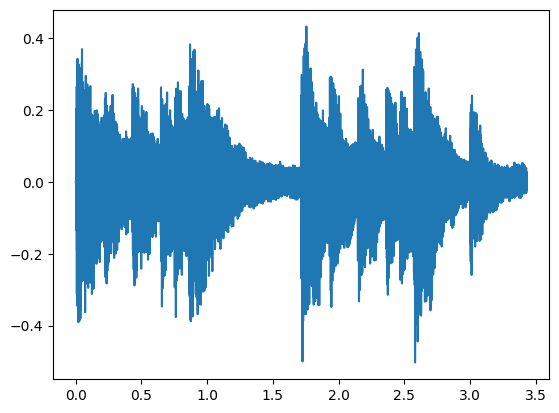

In [67]:
x=[]
y=[]
for i,j in zip(t,pian_c4):
     x.append(i)
     y.append(j)
plt.plot(x,y)

In [62]:
def plot_violin_spectrum(signal, sr, title, f_ratio=1):
    X = np.fft.fft(signal)
    X_mag = np.absolute(X)

    plt.figure(figsize=(18, 5))

    f = np.linspace(0, sr, len(X_mag))
    f_bins = int(len(X_mag)*f_ratio)

    plt.plot(f[:f_bins], X_mag[:f_bins])

    print(len(X_mag[:f_bins]))
    plt.xlabel('Frequency (Hz)')
    plt.title(title)
    

15129


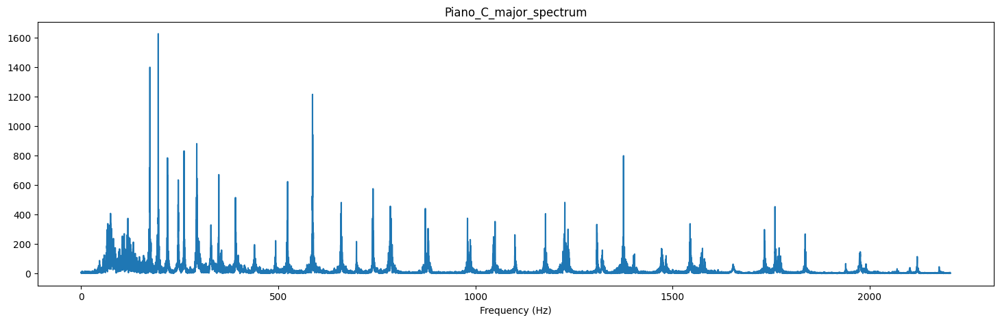

In [68]:
plot_violin_spectrum(pian_c4, sr, "Piano_C_major_spectrum", f_ratio=0.1)

C:\Users\nithish\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\nithish\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


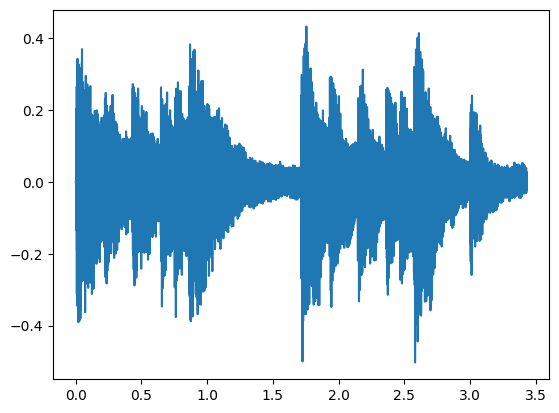

In [69]:
X = np.fft.fft(pian_c4)

# Compute the IDFT of the DFT
x_reconstructed =np.fft.ifft(X)

# Take the real part of the reconstructed signal
z= x_reconstructed
plt.plot(t,z)

 
 

In [70]:
import numpy as np
from scipy.io.wavfile import write

# assume 'y' is your floating point time series and 'sr' is the sampling rate
m =z # your time series data
sr = 22050  # sampling rate

# ensure that the data is in the range [-1, 1]
m= np.clip(m, -1, 1)

# convert the data to 16-bit integers
audio_data = (m* 32767).astype(np.int16)

# write the WAV file
write('piano_c_major.wav', sr, audio_data)

C:\Users\nithish\AppData\Local\Temp\ipykernel_27820\2922848046.py:12: ComplexWarning: Casting complex values to real discards the imaginary part
  audio_data = (m* 32767).astype(np.int16)


In [72]:
ipd.Audio('piano_c_major.wav')

In [ ]:
# filtering using band_stop

In [4]:
import os
import matplotlib.pyplot as plt
import librosa, librosa.display
import IPython.display as ipd
import numpy as np

In [3]:
 bala_c3=("bala_sir_c3.wav")

In [4]:
vi_c3,sr=librosa.load(bala_c3)

In [5]:
# from pydub import AudioSegment

# def converter(sound_file):
#     if sound_file.endswith(".wav"):
#        Audio = AudioSegment.from_wav(  sound_file)
#     # Convert the WAV file to MP3
#     else:
#       Audio = AudioSegment.from_mp3( sound_file)
#       Audio.export(sound_file.replace("mp3","wav"), format="wav")
#     return(Audio)
    


In [6]:
def plot_vishalc3_spectrum(signal, sr, title, f_ratio=1):
    X = np.fft.fft(signal)
    X_mag = np.absolute(X)

    plt.figure(figsize=(18, 5))

    f = np.linspace(0, sr, len(X_mag))
    f_bins = int(len(X_mag)*f_ratio)

    plt.plot(f[:f_bins], X_mag[:f_bins])

    print(len(X_mag[:f_bins]))
    plt.xlabel('Frequency (Hz)')
    plt.title(title)
    

11289


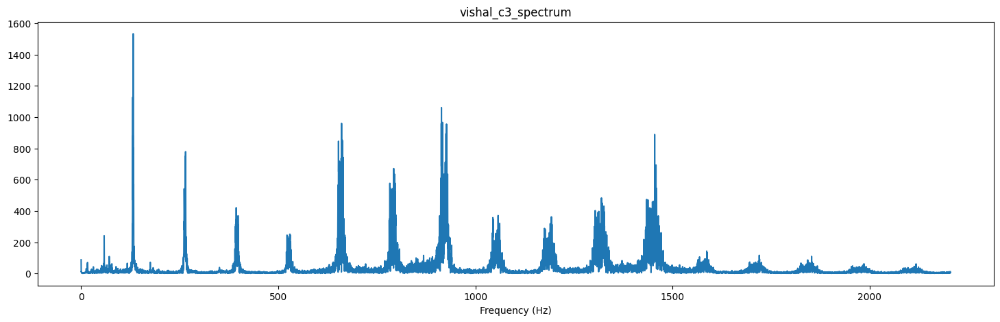

In [7]:
plot_vishalc3_spectrum(vi_c3, sr, "vishal_c3_spectrum", f_ratio=0.1)

In [3]:
import scipy.signal as signal
import scipy
from scipy import signal
import soundfile as sf
 

In [ ]:
# ### Filtering using Band_Stop

In [9]:
import librosa
import numpy as np

def band_stop_filter(y, sr, f_low, f_high):
    """
    Apply a band stop filter to the audio signal.

    Parameters:
    y (numpy array): Audio signal
    sr (int): Sample rate
    f_low (float): Lower frequency bound
    f_high (float): Upper frequency bound

    Returns:
    y_filtered (numpy array): Filtered audio signal
    """
    nyq = sr / 2.0
    f_low_norm = f_low / nyq
    f_high_norm = f_high / nyq

    # Design a band stop filter
    b, a = signal.butter(4, [f_low_norm, f_high_norm], btype='stop')

    # Apply the filter
    y_filtered = scipy.signal.lfilter(b, a, y)

    return y_filtered

# Load an audio file
y, sr = librosa.load('bala_sir_c3.wav')

# Apply the band stop filter
y_filtered = band_stop_filter(y, sr, 550, 2000)

# Save the filtered audio file
# Save the filtered audio file
sf.write('filtered_audio_file.wav', y_filtered, sr)

In [10]:
filter_audio="filtered_audio_file.wav"
filtered_c3,sr=librosa.load(filter_audio)

In [11]:
ipd.Audio(bala_c3)

In [12]:
ipd.Audio(filter_audio)

3386


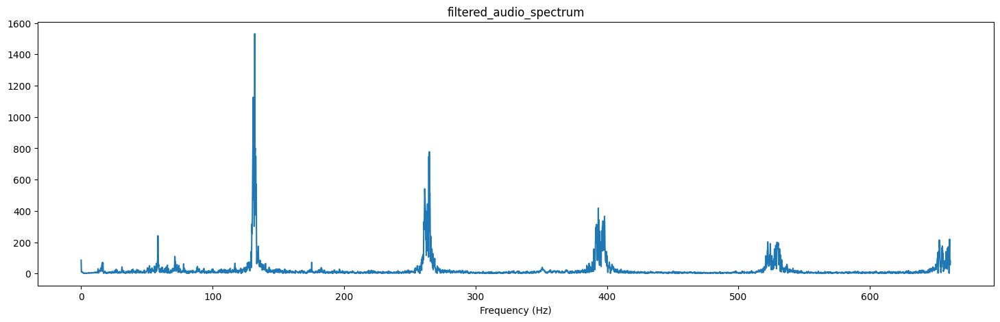

In [13]:
plot_vishalc3_spectrum(filtered_c3, sr, "filtered_audio_spectrum", f_ratio=0.03)

In [19]:
N =112896  # number of samples
fs = 22050  # sampling frequency in Hz
t = np.arange( N)/fs  # time vector
# X = np.fft.fft(pian_c4)

 

C:\Users\nithish\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


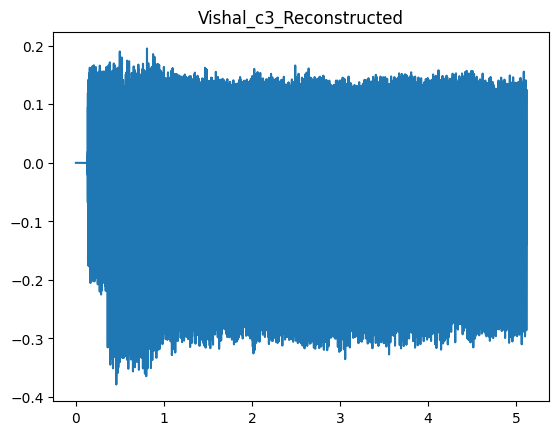

In [22]:
X = np.fft.fft(filtered_c3)

# Compute the IDFT of the DFT
x_reconstructed =np.fft.ifft(X)

# Take the real part of the reconstructed signal
z= x_reconstructed
plt.title("Vishal_c3_Reconstructed")
plt.plot(t,z)

In [23]:
 
import numpy as np
from scipy.io.wavfile import write

# assume 'y' is your floating point time series and 'sr' is the sampling rate
m =z # your time series data
sr = 22050  # sampling rate

# ensure that the data is in the range [-1, 1]
m= np.clip(m, -1, 1)

# convert the data to 16-bit integers
audio_data = (m* 32767).astype(np.int16)

# write the WAV file
write('vishal_ifft_c3.wav', sr, audio_data)

C:\Users\nithish\AppData\Local\Temp\ipykernel_13116\1025611118.py:12: ComplexWarning: Casting complex values to real discards the imaginary part
  audio_data = (m* 32767).astype(np.int16)


In [24]:
p='vishal_ifft_c3.wav'

In [25]:
ipd.Audio(p)

In [135]:
# conert vishal to bala sir

In [1]:
import librosa
import librosa, librosa.display
import numpy as np
import os
import matplotlib.pyplot as plt
import IPython.display as ipd
from scipy.io.wavfile import write

# 

 


vishal="vi_c3.wav"
bala="bala_sir_c3.wav"

In [19]:
ipd.Audio(vishal)

In [3]:
ipd.Audio(bala)

In [4]:
#  Function For converting one Audio To Another

In [14]:
def plot_vishalc3_spectrum(vishal, bala, f_ratio=1):
    # Load the audio files for Vishal and Bala
    v_c3 = vishal
    b_c3 = bala
    vishal_udhay=[]

    # Load the audio data using librosa
    
    vishal_c3, sr = librosa.load(v_c3)
    bala_c3, sr = librosa.load(b_c3)

    # Print the length of the audio data
    print(f"Vishal C3 length: {len(vishal_c3)}")
    print(f"Bala C3 length: {len(bala_c3)}")

    # Take the Fast Fourier Transform (FFT) of the audio data
    v_X = np.fft.fft(vishal_c3)
    b_X = np.fft.fft(bala_c3)

    # Calculate the magnitude of the FFT of Bala's audio data
    b_x_mag = np.abs(b_X)

    # Initialize an empty list to store the converted audio data
    a_converted = []
    # vishal_udhay=[]

    # Iterate over the FFT data of Vishal and Bala
    for v, b in zip(v_X, b_X):
        # Calculate the difference in real and imaginary parts
        real_diff = b.real - v.real
        imag_diff = b.imag - v.imag

        # Convert the difference to a complex number
        a_converted_list = v + complex(real_diff, imag_diff)

        # Append the converted data to the list
        a_converted.append(a_converted_list)
        # vishal_udhay.append(a_converted)
    
    
    # Calculate the magnitude of the converted audio data
    v_x_mag = np.abs(a_converted)

    # Generate a frequency array for plotting
    f = np.linspace(0, sr, len(v_x_mag[:len(b_x_mag)]))
    f_bins = int(len(v_x_mag[:len(b_x_mag)]) * f_ratio)

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

    # Plot the magnitude of the converted audio data
    ax1.plot(f[:f_bins], v_x_mag[:f_bins])
    ax1.set_xlabel('Vishal')

    # Generate a frequency array for plotting Bala's audio data
    f = np.linspace(0, sr, len(b_x_mag))
    f_bins = int(len(b_x_mag) * f_ratio)

    # Plot the magnitude of Bala's audio data
    ax2.plot(f[:f_bins], b_x_mag[:f_bins])
    ax2.set_xlabel('Bala Sir')

    # Print the length of the magnitude arrays
    print(f"Vishal X Mag length: {len(v_x_mag)}")
    print(f"Bala X Mag length: {len(b_x_mag)}")

    # Take the inverse FFT to reconstruct the audio signal
    x_reconstructed = np.fft.ifft(a_converted)

    # Assign the reconstructed signal to a variable
    z = x_reconstructed
    m = z
    sr = 22050

    # Clip the audio data to ensure it's within the range [-1, 1]
    m = np.clip(m, -1, 1)

    # Convert the audio data to 16-bit integers
    audio_data = (m * 32767).astype(np.int16)

    # Write the audio data to a WAV file
    write("v_to_b.wav", sr, audio_data)

Vishal C3 length: 124892
Bala C3 length: 112896
Vishal X Mag length: 112896
Bala X Mag length: 112896


C:\Users\nithish\AppData\Local\Temp\ipykernel_15880\332597388.py:79: ComplexWarning: Casting complex values to real discards the imaginary part
  audio_data = (m * 32767).astype(np.int16)


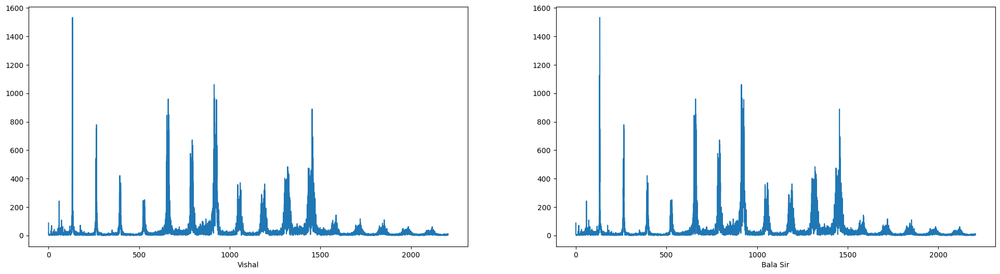

In [16]:
plot_vishalc3_spectrum(vishal,bala   ,f_ratio=0.1)

In [18]:
k="v_to_b.wav"
ipd.Audio(k)

In [25]:
len(vishal_dhaya)

167933

In [90]:

# Vishal Complex Numbers
vishal_li,sr=librosa.load("vi_c3.wav")
vishal=np.fft.fft(vishal_li)

# dhaya Complex Numbers
vishal_dhaya_li,sr=librosa.load("dhaya_c3.wav")
vishal_dhaya=np.fft.fft(vishal_dhaya_li)

# udhay Complex Numbers
vishal_udhay_li,sr=librosa.load("udhau_c3.wav")
vishal_udhay=np.fft.fft(vishal_udhay_li)

# bala Complex Numbers
vishal_bala_li,sr=librosa.load("bala_sir_c3.wav")
vishal_bala=np.fft.fft(vishal_bala_li)

# guru Complex Numbers
vishal_guru_li,sr=librosa.load("guru_c3.wav")
vishal_guru=np.fft.fft(vishal_guru_li)

# violin_c4 Complex Numbers
violin_c4_li,sr=librosa.load("violin_c4.wav")
violin_c4=np.fft.fft(violin_c4_li)

# piano_c4 Complex Numbers
piano_c4_li,sr=librosa.load("piano_c4.wav")
piano_c4=np.fft.fft(piano_c4_li)

# piano_c_major Complex Numbers
piano_c_major_li,sr=librosa.load("c-major-f-g-piano-chord.ogg")
piano_c_major=np.fft.fft(piano_c_major_li)

# violin_c_major Complex Numbers
violin_c_major_li,sr=librosa.load("violin_c_major_synthetic.wav")
violin_c_major=np.fft.fft(violin_c_major_li)


print("Vishal == ",len(vishal),"\n\ndhaya == ",len(vishal_dhaya),"\n\nudhay == ",len(vishal_udhay),"\n\nbala == ",len(vishal_bala),"\n\nguru == ",len(vishal_guru),"\n\nviolin_c4 ==",len(violin_c4),"\n\npiano_c4 == ",len(piano_c4),"\n\npiano_c_major == ",len(piano_c_major),"\n\nviolin_c_major == ",len(violin_c_major))

Vishal ==  124892 

dhaya ==  167933 

udhay ==  122304 

bala ==  112896 

guru ==  80968 

violin_c4 == 87619 

piano_c4 ==  119543 

piano_c_major ==  151296 

violin_c_major ==  853984


In [93]:
ipd.Audio("c-major-f-g-piano-chord.ogg")

In [94]:
 ipd.Audio("violin_c_major_synthetic.wav")